In [60]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline
VISUALIZE=True
SAVE_IMGS=True

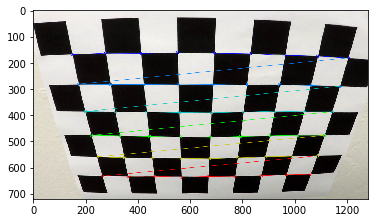

In [61]:
if VISUALIZE:
    img = mpimg.imread('./camera_cal/calibration2.jpg')
    plt.imshow(img)
    objpoints = []
    imgpoints = []

    objp = np.zeros((6*9, 3), np.float32)
    objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

        img = cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        plt.imshow(img)

In [62]:
import glob

In [63]:
images = glob.glob('./camera_cal/calibration*.jpg')

In [64]:
objpoints = []
imgpoints = []

objp = np.zeros((6*9, 3), np.float32)
objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1, 2)

for fname in images:
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)

In [65]:
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = \
        cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [66]:
if VISUALIZE:
    img = mpimg.imread('./camera_cal/calibration5.jpg')
    undistorted = cal_undistort(img, objpoints, imgpoints)

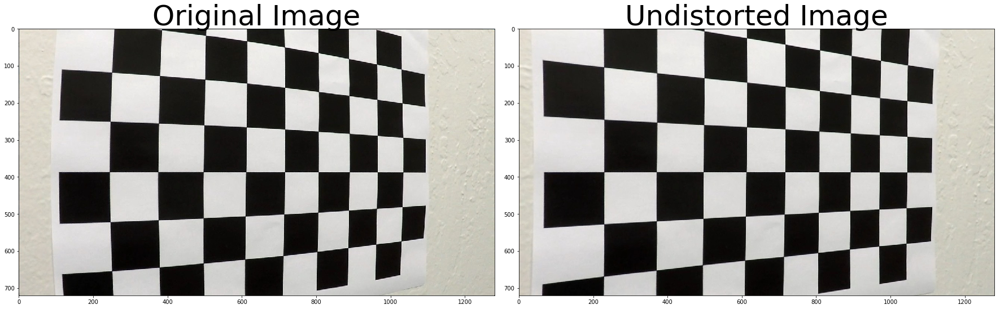

In [67]:
if VISUALIZE:
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    if SAVE_IMGS:
        f.savefig('./writeup_images/undistortchess.png')

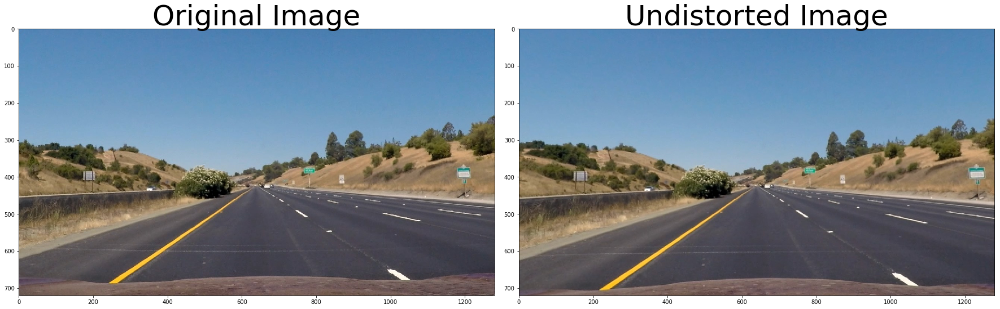

In [68]:
if VISUALIZE:
    img = mpimg.imread('./test_images/straight_lines1.jpg')
    undistorted = cal_undistort(img, objpoints, imgpoints)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    if SAVE_IMGS:
        f.savefig('./writeup_images/undistortlane.png')

In [69]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [91]:
def mean_brightness(img, show=False, fname=None):
    img = np.copy(img)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    imshape = hsv.shape
    
    ysize = int(imshape[0])
    xsize = int(imshape[1])
    half = ysize//2
    
    top_left = (int((xsize/2)-150), int((ysize/2)+(ysize*.1)))
    top_right = (int((xsize/2)+150), int((ysize/2)+(ysize*.1)))
    bottom_left = (50, ysize)
    bottom_right = (xsize-30, ysize)
    
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    masked_img = region_of_interest(hsv, vertices)
#     plt.imshow(masked_img)
    
#     masked_image = hsv[half+30:ysize,220:1100]
    mean_brightness = np.mean(masked_img[:, :, 2])
    if show:
        show_image = cv2.cvtColor(masked_img, cv2.COLOR_HSV2RGB)
        f1, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))

        ax1.imshow(img)    
        if fname:
            ax1.set_title('Image: {}'.format(fname.split('/')[-1]), fontsize=30)
            
        ax2.imshow(show_image)
        ax2.set_title('Mean brightness: {}'.format(mean_brightness), fontsize=30)
        if SAVE_IMGS:
            f1.savefig('./writeup_images/mean_brightness2.png', bbox_inches='tight')
    
    return mean_brightness
    

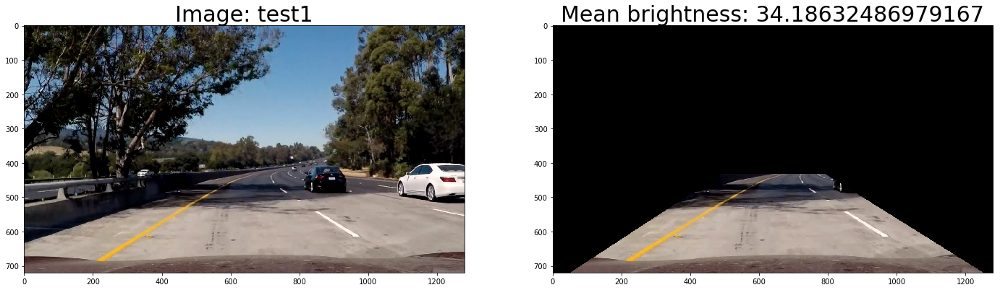

In [95]:
if VISUALIZE:
    img = mpimg.imread('./test_images/test5.jpg')

    mean_brightness(img, show=True, fname='test1')

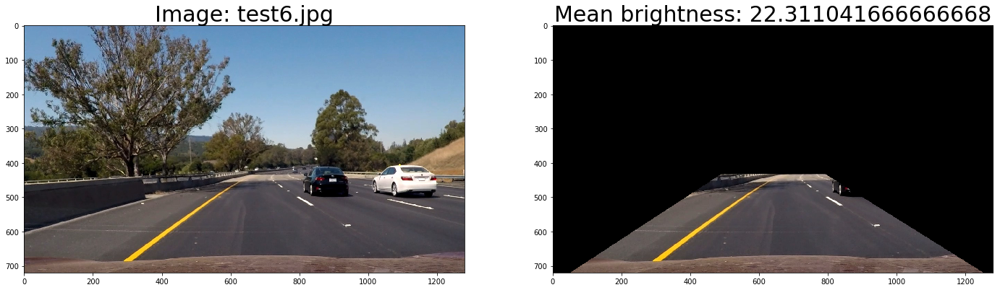

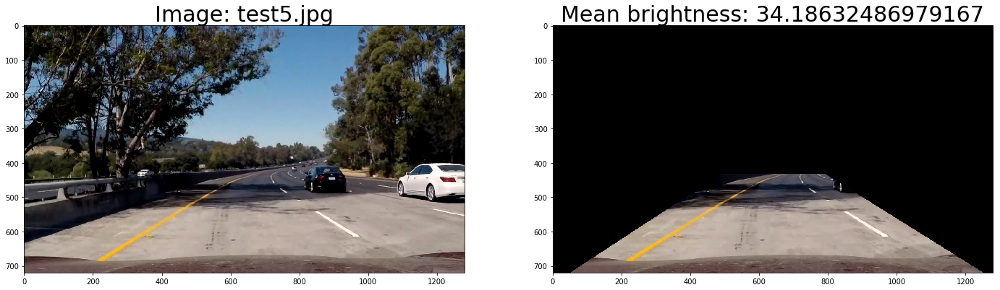

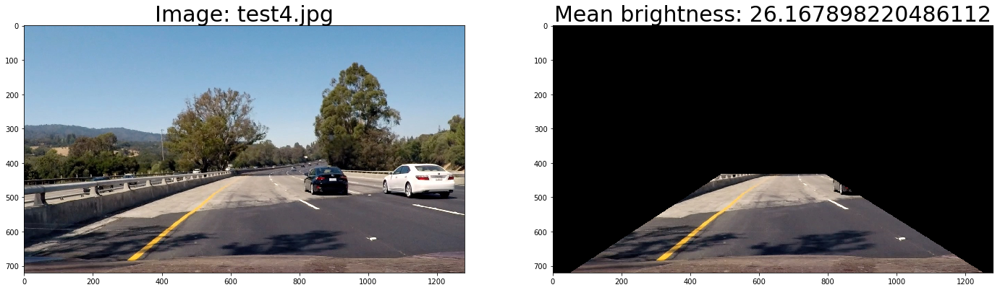

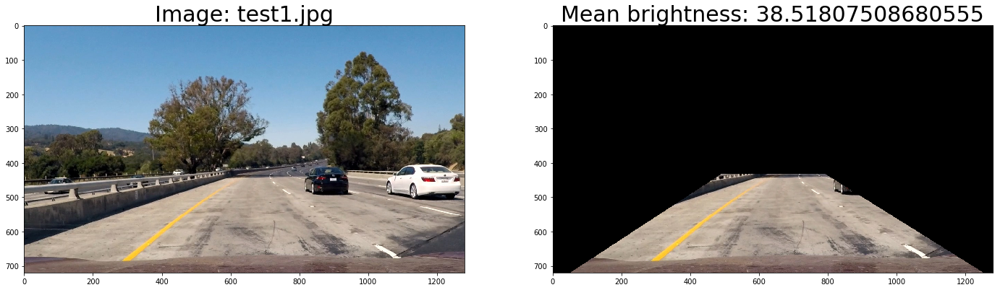

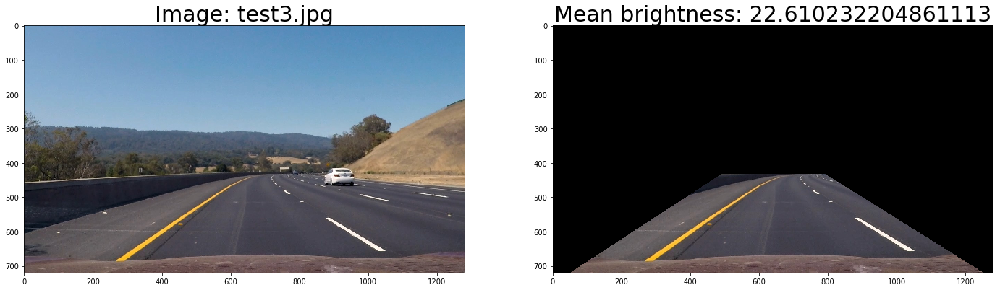

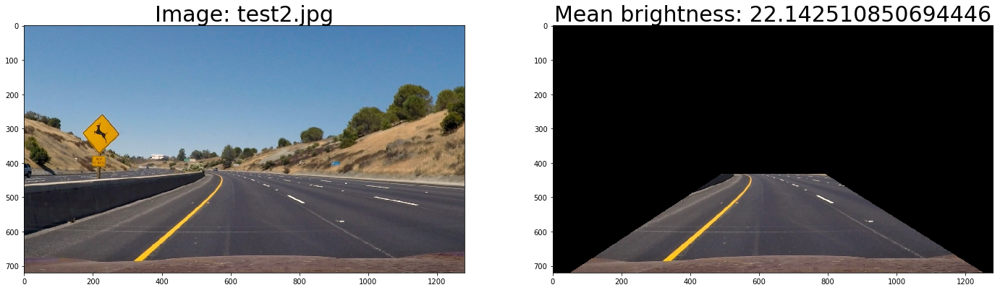

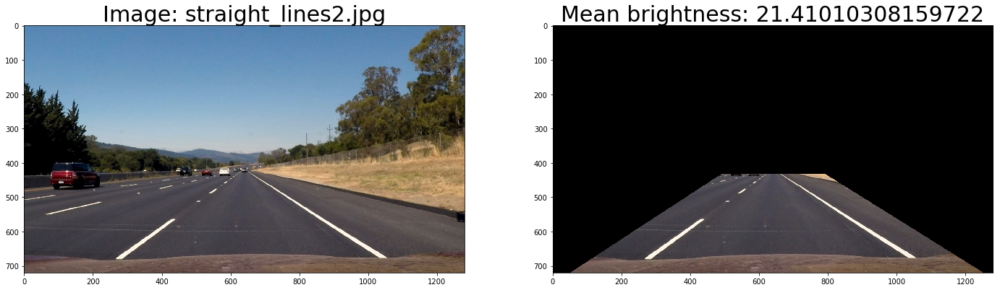

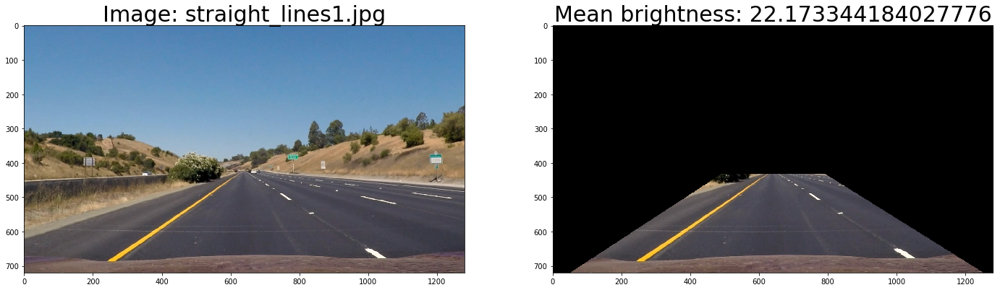

In [93]:
if VISUALIZE:
    test_images = glob.glob('./test_images/test*.jpg')

    for fname in test_images:
        img = mpimg.imread(fname)
        mean_brightness(img, show=True, fname=fname)

    line_images = glob.glob('./test_images/straight_lines*.jpg')

    for fname in line_images:
        img = mpimg.imread(fname)
        mean_brightness(img, show=True, fname=fname)

In [75]:
def threshold_pipeline(img, sobel=False, combine=True, plot=False):

    # define thresholdes
    s_thresh = (170, 255)
    r_thresh = (210, 255)
    g_thresh = (190, 255)
    l_thresh = (195, 255)
    sx_thresh = (40, 100)
    brightness_thresh = 24
    
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    l_channel = hls[:, :, 1]
    
    rgb = np.copy(img)
    r_channel = rgb[:, :, 0]
    g_channel = rgb[:, :, 1]
    b_channel = rgb[:, :, 2]

    brightness = mean_brightness(img)
    
    if int(brightness) > brightness_thresh:
        r_thresh = (240, 255)
        s_thresh = (170, 245)
        g_thresh= (220, 255)
#     if sobel:
#     # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    r_binary = np.zeros_like(r_channel)
    r_binary[(r_channel >= r_thresh[0]) & (r_channel <= r_thresh[1])] = 1
#     plt.imshow(r_binary, cmap='gray')
    g_binary = np.zeros_like(g_channel)
    g_binary[(g_channel >= g_thresh[0]) & (g_channel <= g_thresh[1])] = 1
#     plt.imshow(g_binary, cmap='gray')
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    
    rg_binary = np.zeros_like(s_channel)
    rg_binary[(r_binary == 1) | (g_binary==1)] = 1
#     rg_binary[(r_binary == 1)] = 1
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.uint8(np.dstack((rg_binary, s_binary, l_binary))\
                            * 255)
    
    combined_binary = np.zeros_like(s_channel)
    combined_binary[(s_binary == 1) | (rg_binary==1)] = 1
    
    if int(brightness) <= brightness_thresh:
        combined_binary[(l_binary==1)] = 1

    if sobel:
        combined_binary[(sxbinary==1)] = 1
        
    if plot:
        f, ax = plt.subplots(5, 2, figsize=(24, 45))
        [[ax1, ax2],[ax3, ax4], [ax5, ax6], [ax7, ax8], [ax9, ax10]] = ax
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=40)

        ax2.imshow(s_channel, cmap='gray')
        ax2.set_title('S channel of HLS', fontsize=40)
        
        ax3.imshow(r_channel, cmap='gray')
        ax3.set_title('R channel of RGB', fontsize=40)
        
        ax4.imshow(l_channel, cmap='gray')
        ax4.set_title('L channel of HLS', fontsize=40)
        
        ax5.imshow(g_channel, cmap='gray')
        ax5.set_title('G channel of RGB', fontsize=40)

        ax6.imshow(s_binary, cmap='gray')
        ax6.set_title('S Binary Threshold: {}'.format(s_thresh), fontsize=40)
        
        ax7.imshow(rg_binary, cmap='gray')
        ax7.set_title('R G Binary Threshold: {}, {}'.format(r_thresh, g_thresh), fontsize=40)
        
        ax8.imshow(l_binary, cmap='gray')
        ax8.set_title('L Binary Threshold: {}'.format(l_thresh), fontsize=40)
    
        ax9.imshow(combined_binary, cmap='gray')
        ax9.set_title('Combined Threshold', fontsize=40)
        
        combined_binary_sobel = np.copy(combined_binary)
        combined_binary_sobel[(sxbinary==1)] = 1
        
        ax10.imshow(combined_binary_sobel, cmap='gray')
        ax10.set_title('Combined Threshold with Sobel', fontsize=40)
        
        plt.subplots_adjust(left=0., right=1, top=1, bottom=0.)
        plt.show()
        if SAVE_IMGS:
            f.savefig('./writeup_images/binary_threshold.jpg')
#         plt.close()
    if combine:
        return combined_binary
    else:
        return color_binary
    

Mean brightness 34.18632486979167


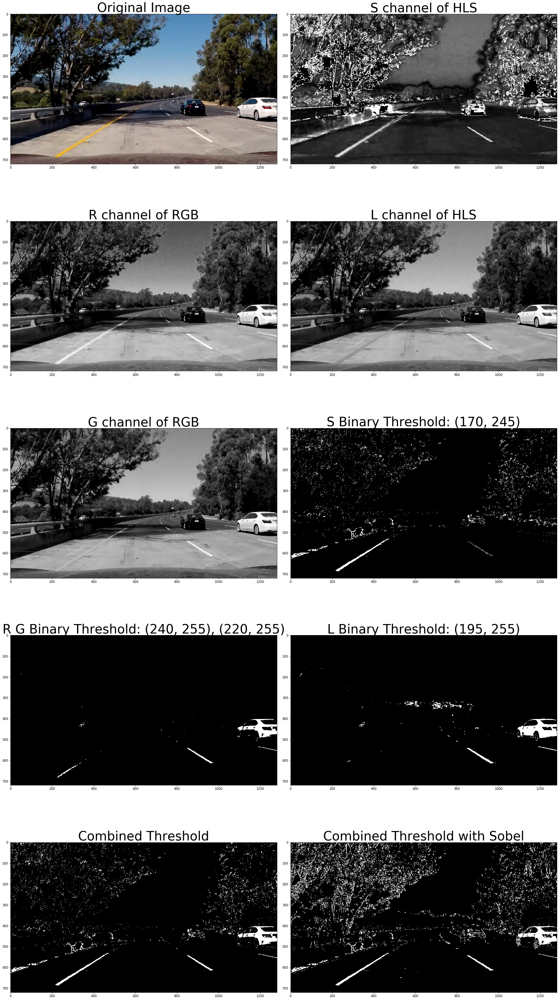

In [76]:
if VISUALIZE:
    img = mpimg.imread('./test_images/test5.jpg')
    print('Mean brightness', mean_brightness(img))
    result = threshold_pipeline(img, combine = True, plot=True)

In [16]:
if VISUALIZE:
    img = mpimg.imread('./test_images/test4.jpg') 
    print('Mean brightness', mean_brightness(img))
    result = threshold_pipeline(img, combine = True, plot=True)

In [17]:
if VISUALIZE:
    test_images = glob.glob('./test_images/test*.jpg')

    for fname in test_images:
        img = mpimg.imread(fname)
        result = threshold_pipeline(img, sobel=True)
        f1, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f1.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image: {}'.format(fname.split('/')[-1]), fontsize=40)
        ax2.imshow(result, cmap='gray')
        ax2.set_title('Pipeline Result', fontsize=40)

    line_images = glob.glob('./test_images/straight_lines*.jpg')

    for fname in line_images:
        img = mpimg.imread(fname)
        result = threshold_pipeline(img, sobel=True)
        f1, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f1.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image: {}'.format(fname.split('/')[-1]), fontsize=40)
        ax2.imshow(result, cmap='gray')
        ax2.set_title('Pipeline Result', fontsize=40)


## Perspective Tranform

In [77]:
def perspective_transform(img, unwarp=False):
    offset = 100 # offset for dst points
            # Grab the image shape
    img_size = (img.shape[1], img.shape[0])
    
#     src_pt1 = [585, 460]
#     dst_pt1 = [320, 0]
#     src_pt2 = [203, 720]
#     dst_pt2 = [320, 720]
#     src_pt3 = [1127, 720]
#     dst_pt3 = [960, 720]
#     src_pt4 = [695, 460]
#     dst_pt4 = [960, 0]

    src_pt1 = [585, 460]
    dst_pt1 = [320, 0]
    src_pt2 = [200, 720]
    dst_pt2 = [320, 720]
    src_pt3 = [1100, 720]
    dst_pt3 = [960, 720]
    src_pt4 = [705, 460]
    dst_pt4 = [960, 0]

    src = np.float32([src_pt1, src_pt2, src_pt3, src_pt4])
    dst = np.float32([dst_pt1, dst_pt2, dst_pt3, dst_pt4])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    if unwarp:
        warped = cv2.warpPerspective(img, Minv, img_size, flags=cv2.INTER_LINEAR)
    else:
        warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

In [19]:
if VISUALIZE:
    img = mpimg.imread('./test_images/straight_lines1.jpg')

    src_pt1 = [585, 460]
    dst_pt1 = [320, 0]
    src_pt2 = [200, 720]
    dst_pt2 = [320, 720]
    src_pt3 = [1100, 720]
    dst_pt3 = [960, 720]
    src_pt4 = [705, 460]
    dst_pt4 = [960, 0]


    transformed_result = perspective_transform(img)
    unwarped_result = perspective_transform(transformed_result, unwarp=True)
    cv2.circle(img,(src_pt1[0], src_pt1[1]),10,(255,0,0), -11)
    cv2.circle(img,(src_pt2[0], src_pt2[1]),10,(255,0,0), -11)
    cv2.circle(img,(src_pt3[0], src_pt3[1]),10,(255,0,0), -11)
    cv2.circle(img,(src_pt4[0], src_pt4[1]),10,(255,0,0), -11)

    cv2.circle(transformed_result,(dst_pt1[0], dst_pt1[1]),10,(255,0,0), -11)
    cv2.circle(transformed_result,(dst_pt2[0], dst_pt2[1]),10,(255,0,0), -11)
    cv2.circle(transformed_result,(dst_pt3[0], dst_pt3[1]),10,(255,0,0), -11)
    cv2.circle(transformed_result,(dst_pt4[0], dst_pt4[1]),10,(255,0,0), -11)

    f1, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f1.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(transformed_result, cmap='gray')
    ax2.set_title('Perspective Transform Result', fontsize=30)
    ax3.imshow(unwarped_result, cmap='gray')
    ax3.set_title('Unwarped Perspective Transform Result', fontsize=30)
    plt.show()
    if SAVE_IMGS:
        f1.savefig('./writeup_images/perspectivetranform1.png')

In [20]:

if VISUALIZE:
    test_images = glob.glob('./test_images/test*.jpg')

    for fname in test_images:
        img = mpimg.imread(fname)
        result = threshold_pipeline(img, sobel=True)
        transformed_result = perspective_transform(result)
        f1, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
        f1.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image: {}'.format(fname.split('/')[-1]), fontsize=40)
        ax2.imshow(result, cmap='gray')
        ax2.set_title('Pipeline Result', fontsize=40)
        ax3.imshow(transformed_result, cmap='gray')
        ax3.set_title('Perspective Transform')

    line_images = glob.glob('./test_images/straight_lines*.jpg')

    for fname in line_images:
        img = mpimg.imread(fname)
        result = threshold_pipeline(img, sobel=True)
        transformed_result = perspective_transform(result)
        f1, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
        f1.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image: {}'.format(fname.split('/')[-1]), fontsize=40)
        ax2.imshow(result, cmap='gray')
        ax2.set_title('Pipeline Result', fontsize=40)
        ax3.imshow(transformed_result, cmap='gray')
        ax3.set_title('Perspective Transform')

In [22]:
if VISUALIZE:
    # plt.imshow(transformed_result, cmap='gray')
    histogram = np.sum(transformed_result[(transformed_result.shape[0]//2):,:], axis=0)
    plt.plot(histogram)
    # plt.imshow(transformed_result, cmap='gray')
    binary_warped = np.copy(transformed_result)

In [23]:
def fit_lines(binary_warped):
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return ploty, left_fitx, right_fitx, left_fit, right_fit, out_img

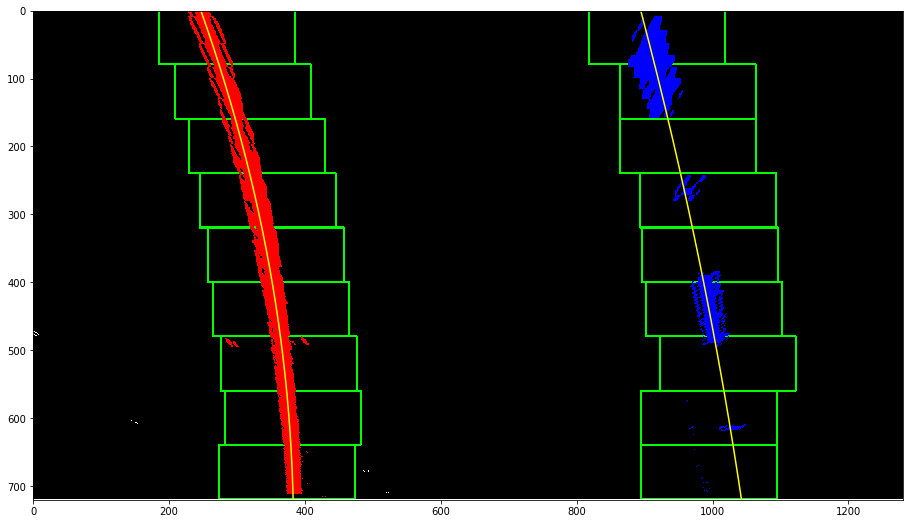

In [86]:

if VISUALIZE:
    img = mpimg.imread('./test_images/test2.jpg')
    undist = cal_undistort(img, objpoints, imgpoints)

    binary = threshold_pipeline(undist, sobel=True)

    binary_warped = perspective_transform(binary)
    ploty, left_fitx, right_fitx, left_fit, right_fit, out_img = fit_lines(binary_warped)
    f = plt.figure(figsize=(24, 9))
    f.tight_layout()
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()
    if SAVE_IMGS:
        f.savefig('./writeup_images/fitlines.png', bbox_inches='tight')

In [25]:
def continuous_fit_lines(binary_warped, prev_left_fit, prev_right_fit, margin=100):
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (prev_left_fit[0]*(nonzeroy**2) + prev_left_fit[1]*nonzeroy + 
    prev_left_fit[2] - margin)) & (nonzerox < (prev_left_fit[0]*(nonzeroy**2) + 
    prev_left_fit[1]*nonzeroy + prev_left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (prev_right_fit[0]*(nonzeroy**2) + prev_right_fit[1]*nonzeroy + 
    prev_right_fit[2] - margin)) & (nonzerox < (prev_right_fit[0]*(nonzeroy**2) + 
    prev_right_fit[1]*nonzeroy + prev_right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return ploty, left_fitx, right_fitx, left_fit, right_fit, out_img

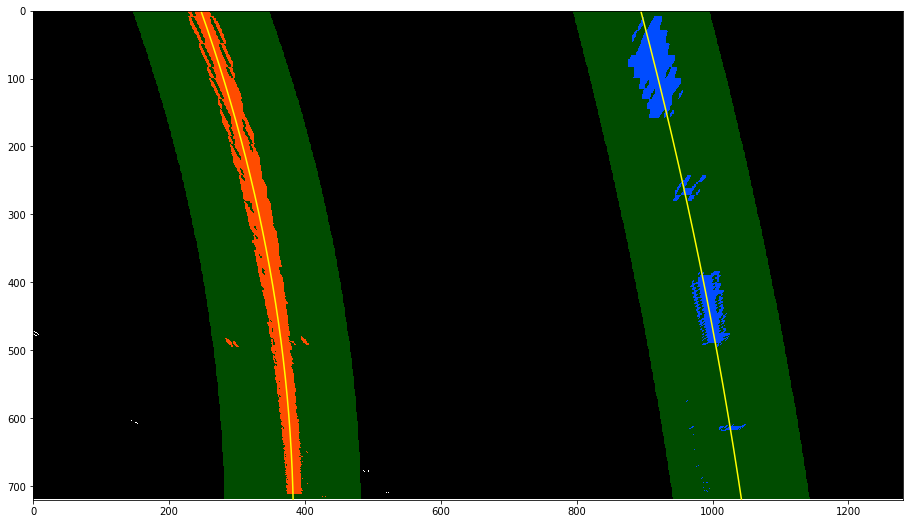

In [87]:
if VISUALIZE:
    margin=100
    ploty, left_fitx, right_fitx, left_fit, right_fit, out_img = continuous_fit_lines(binary_warped, left_fit, right_fit, margin=margin)
    # Generate x and y values for plotting
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels


    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    f = plt.figure(figsize=(24, 9))
    f.tight_layout()
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()
    if SAVE_IMGS:
        f.savefig('./writeup_images/continfitlines.png', bbox_inches='tight')

In [27]:
def find_curvature(ploty, leftx, rightx, left_fit, right_fit):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    center = (((left_fit[0]*720**2+left_fit[1]*720+left_fit[2]) +(right_fit[0]*720**2+right_fit[1]*720+right_fit[2]) ) /2 - 640)*xm_per_pix
    
    return left_curverad, right_curverad, center

In [83]:
if VISUALIZE:
    ploty, left_fitx, right_fitx, left_fit, right_fit, out_img = fit_lines(binary_warped)

    left_curverad, right_curverad, center = find_curvature(ploty, left_fitx, right_fitx, left_fit, right_fit)
    print((left_curverad + right_curverad)/2)
    print(center)


1384.6384035352403
0.38394600577447713


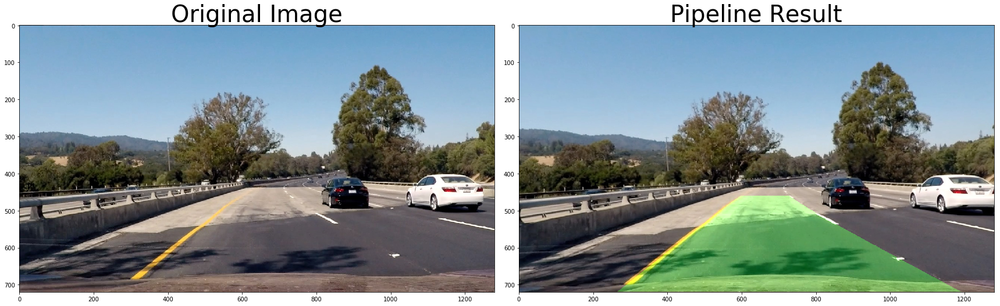

In [84]:
if VISUALIZE:
    img = mpimg.imread('./test_images/test4.jpg')
    undist = cal_undistort(img, objpoints, imgpoints)

    binary = threshold_pipeline(undist, sobel=True)

    binary_warped = perspective_transform(binary)

    ploty, left_fitx, right_fitx, left_fit, right_fit, out_img = fit_lines(binary_warped)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = perspective_transform(color_warp, unwarp = True)
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

    f1, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f1.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(result)
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.show()
    if SAVE_IMGS:
        f1.savefig('./writeup_images/lanesdetected.png')

In [55]:
def final_pipeline(img):
    
    global prev_left_coeff
    global prev_right_coeff
    
    global left
    global right
    
    global prev_avg_left
    global prev_avg_right
    plt.clf()
    
#     img = np.copy(image)
    
    undist = cal_undistort(img, objpoints, imgpoints)
    
    binary = threshold_pipeline(img, sobel=True)

    binary_warped = perspective_transform(binary)
    
    if (prev_left_coeff is None) or (prev_right_coeff is None):
        ploty, left_fitx, right_fitx, left_fit, right_fit, out_img = fit_lines(binary_warped)
    else:
        ploty, left_fitx, right_fitx, left_fit, right_fit, out_img = continuous_fit_lines(binary_warped, prev_left_coeff, prev_right_coeff)
    
    n = 15
    len_right = len(right)
    if(len_right < n):
        right.append(right_fit)
#         length_rightlines = len(moving_rightlines)
#         avg_right = [sum(col)/length_rightlines for col in zip(*moving_rightlines)]
        avg_right = sum(right) / len(right)
    else:
        right.pop(0)
        right.append(right_fit)
        avg_right = sum(right) / len(right)
    
    len_left = len(left)
    if(len_left < n):
        left.append(left_fit)
#         length_leftlines = len(moving_leftlines)
#         avg_left = [sum(col)/length_leftlines for col in zip(*moving_leftlines)]
        avg_left = sum(left) / len(left)
    else:
        left.pop(0)
        left.append(left_fit)
        avg_left = sum(left) / len(left)
    
    
    left_curverad, right_curverad, center_offset = find_curvature(ploty, left_fitx, right_fitx, left_fit, right_fit)
    
    # sanity check
    if(abs(left_curverad/right_curverad) < 0.5) or (abs(left_curverad/right_curverad) > 2):
        ploty, left_fitx, right_fitx, left_fit, right_fit, out_img = fit_lines(binary_warped)
        
        left_curverad, right_curverad, center_offset = find_curvature(ploty, left_fitx, right_fitx, left_fit, right_fit)
        
#         if(abs(left_curverad/right_curverad) < 0.5) or (abs(left_curverad/right_curverad) > 2):
    left_fit = avg_left
    right_fit = avg_right
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_curverad, right_curverad, center_offset = find_curvature(ploty, left_fitx, right_fitx, left_fit, right_fit)
    average_curverad = (left_curverad + right_curverad)/2
    
    warp_zero = np.zeros_like(binary_warped)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = perspective_transform(color_warp, unwarp = True)
    # Combine the result with the original image
    final_result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    cv2.putText(final_result,'Radius: {0:.2f}m'.format(average_curverad), (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=2)
    cv2.putText(final_result,'Offset: {0:.2f}m'.format(center_offset), (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=2)
    
    
    prev_left_coeff = left_fit
    prev_right_coeff = right_fit
    prev_avg_right = avg_right
    prev_avg_left = avg_left
    
    return final_result

<Figure size 432x288 with 0 Axes>

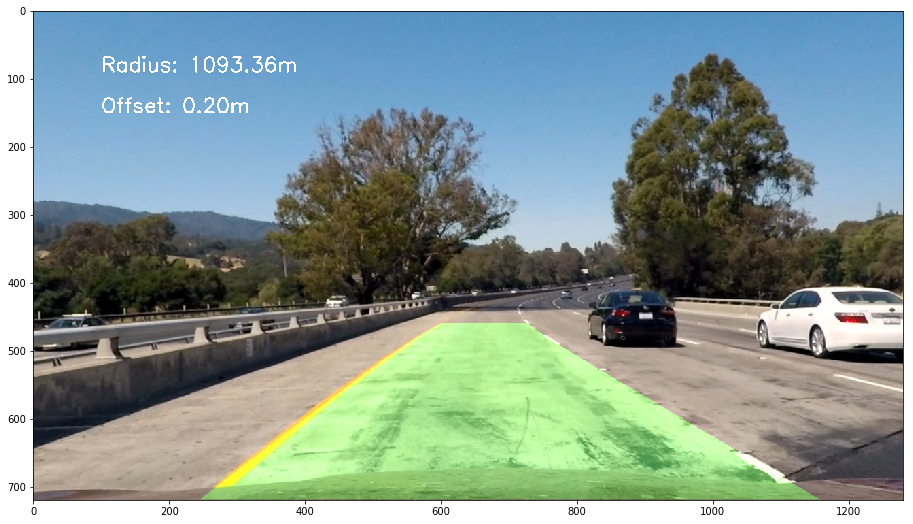

In [85]:
VISUALIZE = True
if VISUALIZE: 
    image = mpimg.imread('./test_images/test1.jpg')
    prev_left_coeff = None
    prev_right_coeff = None
    right = []
    left = []
    result_final = final_pipeline(image)
    f = plt.figure(figsize=(24, 9))
    f.tight_layout()
    plt.imshow(result_final)
    plt.show()

In [58]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

prev_left_coeff = None
prev_right_coeff = None
right = []
left = []

output = 'avg-final-project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")#.subclip(15,25)
white_clip = clip1.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video avg-final-project_video_output.mp4
[MoviePy] Writing video avg-final-project_video_output.mp4



100%|█████████▉| 1260/1261 [27:34<00:01,  1.61s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: avg-final-project_video_output.mp4 

CPU times: user 27min 11s, sys: 1min 3s, total: 28min 15s
Wall time: 27min 36s


<Figure size 432x288 with 0 Axes>

In [59]:
prev_left_coeff = None
prev_right_coeff = None
right = []
left = []

output = 'challenge_video_output.mp4'
clip1 = VideoFileClip("challenge_video.mp4")#.subclip(15,25)
white_clip = clip1.fl_image(final_pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4



100%|██████████| 485/485 [10:30<00:00,  1.10s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 10min 19s, sys: 26.5 s, total: 10min 46s
Wall time: 10min 32s


<Figure size 432x288 with 0 Axes>